In [1]:
TRAIN = '/kaggle/input/datasets/junpr9/cannabis-seed-dataset/CannabisSeedsV2'

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth


100%|██████████| 95.8M/95.8M [00:00<00:00, 163MB/s]


In [3]:
import arrow
import base64
import pandas as pd
import tqdm

from glob import iglob
from io import BytesIO
from os.path import basename
from os.path import isdir
from PIL import Image


THUMBNAIL_SIZE = (32, 32)

def embed(model, filename: str):
    with Image.open(fp=filename, mode='r') as image:
        return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGBA').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def get_picture_from_glob(arg: str, tag: str,) -> list:
    time_get = arrow.now()
    input_files = list(iglob(pathname=arg))
    input_files = [item for item in input_files if (item.endswith('.JPG') or item.endswith('.jpg'))]
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'] )
        for index, input_file in enumerate(tqdm.tqdm(input_files))]
    print('encoded {} rows of {}  in {}'.format(len(result), tag, arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*') if isdir(folder) }
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key.replace('_', ' ')) for key, value in train_dict.items()]))
print('done in {}'.format(arrow.now() - time_start))

100%|██████████| 141/141 [01:05<00:00,  2.16it/s]


encoded 141 rows of Krerng Ka Via  in 0:01:05.192077


100%|██████████| 153/153 [01:24<00:00,  1.82it/s]


encoded 153 rows of Hang Kra Rog  KU  in 0:01:24.079752


100%|██████████| 106/106 [00:53<00:00,  1.98it/s]


encoded 106 rows of AK47 photo  in 0:00:53.674330


100%|██████████| 249/249 [01:52<00:00,  2.22it/s]


encoded 249 rows of Hang Kra Rog Phu Phan ST1  in 0:01:52.110175


100%|██████████| 327/327 [02:31<00:00,  2.16it/s]


encoded 327 rows of Gelato photo  in 0:02:31.241688


100%|██████████| 49/49 [00:20<00:00,  2.39it/s]


encoded 49 rows of KD  in 0:00:20.499522


100%|██████████| 147/147 [01:06<00:00,  2.20it/s]


encoded 147 rows of KD KT  in 0:01:06.920350


100%|██████████| 203/203 [01:23<00:00,  2.42it/s]


encoded 203 rows of blackberry auto  in 0:01:23.969366


100%|██████████| 212/212 [01:44<00:00,  2.03it/s]


encoded 212 rows of Thaistick Foi Thong  in 0:01:44.235152


100%|██████████| 233/233 [01:46<00:00,  2.19it/s]


encoded 233 rows of skunk auto  in 0:01:46.647885


100%|██████████| 554/554 [04:18<00:00,  2.15it/s]


encoded 554 rows of gorillar purple  in 0:04:18.070368


100%|██████████| 327/327 [02:21<00:00,  2.32it/s]


encoded 327 rows of sour deisel auto  in 0:02:21.202259


100%|██████████| 93/93 [00:40<00:00,  2.27it/s]


encoded 93 rows of Hang Suea Sakon Nakhon TT1  in 0:00:40.912705


100%|██████████| 50/50 [00:22<00:00,  2.21it/s]


encoded 50 rows of cherry pie  in 0:00:22.672355


100%|██████████| 183/183 [01:19<00:00,  2.31it/s]


encoded 183 rows of Tanaosri Kan Kaw WA1  in 0:01:19.131817


100%|██████████| 151/151 [00:59<00:00,  2.55it/s]


encoded 151 rows of purple duck  in 0:00:59.299135


100%|██████████| 157/157 [01:12<00:00,  2.18it/s]


encoded 157 rows of Tanaosri Kan Daeng RD1  in 0:01:12.082568
done in 0:25:22.217190


In [4]:
train_df['tag'].value_counts(normalize=True).to_frame().T

tag,gorillar purple,sour deisel auto,Gelato photo,Hang Kra Rog Phu Phan ST1,skunk auto,Thaistick Foi Thong,blackberry auto,Tanaosri Kan Kaw WA1,Tanaosri Kan Daeng RD1,Hang Kra Rog KU,purple duck,KD KT,Krerng Ka Via,AK47 photo,Hang Suea Sakon Nakhon TT1,cherry pie,KD
proportion,0.166117,0.098051,0.098051,0.074663,0.069865,0.063568,0.06087,0.054873,0.047076,0.045877,0.045277,0.044078,0.042279,0.031784,0.027886,0.014993,0.014693


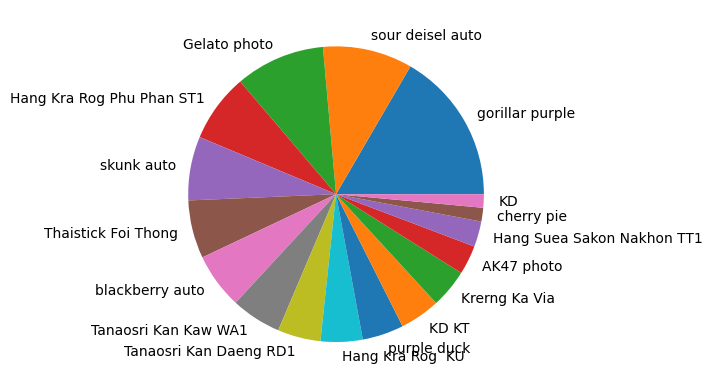

In [5]:
import matplotlib.pyplot as plt

train_df['tag'].value_counts(normalize=False).to_frame().plot.pie(y='count')
plt.ylabel('')
plt.legend().remove()
plt.show()

In [6]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2026, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 3335 samples in 0.029s...
[t-SNE] Computed neighbors for 3335 samples in 1.107s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3335
[t-SNE] Computed conditional probabilities for sample 2000 / 3335
[t-SNE] Computed conditional probabilities for sample 3000 / 3335
[t-SNE] Computed conditional probabilities for sample 3335 / 3335
[t-SNE] Mean sigma: 1.830629
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.691078
[t-SNE] KL divergence after 1000 iterations: 0.299767


In [7]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']].sample(n=min(len(train_df) - 1, 10000)))
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: cannabis seeds', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

In [8]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(train_df['value'].apply(pd.Series), train_df['tag'], test_size=0.25, random_state=2026, stratify=train_df['tag'])
logreg = LogisticRegression(max_iter=10000, tol=1e-12).fit(X_train, y_train)
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=y_test, y_pred=logreg.predict(X=X_test))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=y_test, y_pred=logreg.predict(X=X_test))))
print(classification_report(y_true=y_test, y_pred=logreg.predict(X=X_test), zero_division=0.0))

model fit in 2267 iterations
accuracy: 0.9472
f1: 0.9457
                            precision    recall  f1-score   support

                AK47 photo       1.00      1.00      1.00        27
              Gelato photo       0.89      0.95      0.92        82
          Hang Kra Rog  KU       1.00      1.00      1.00        38
 Hang Kra Rog Phu Phan ST1       0.91      0.95      0.93        62
Hang Suea Sakon Nakhon TT1       1.00      0.91      0.95        23
                        KD       0.71      0.83      0.77        12
                     KD KT       0.88      0.76      0.81        37
             Krerng Ka Via       0.97      0.86      0.91        35
    Tanaosri Kan Daeng RD1       0.88      0.90      0.89        39
      Tanaosri Kan Kaw WA1       1.00      0.89      0.94        46
       Thaistick Foi Thong       1.00      1.00      1.00        53
           blackberry auto       0.96      1.00      0.98        51
                cherry pie       0.71      0.42      0.53 

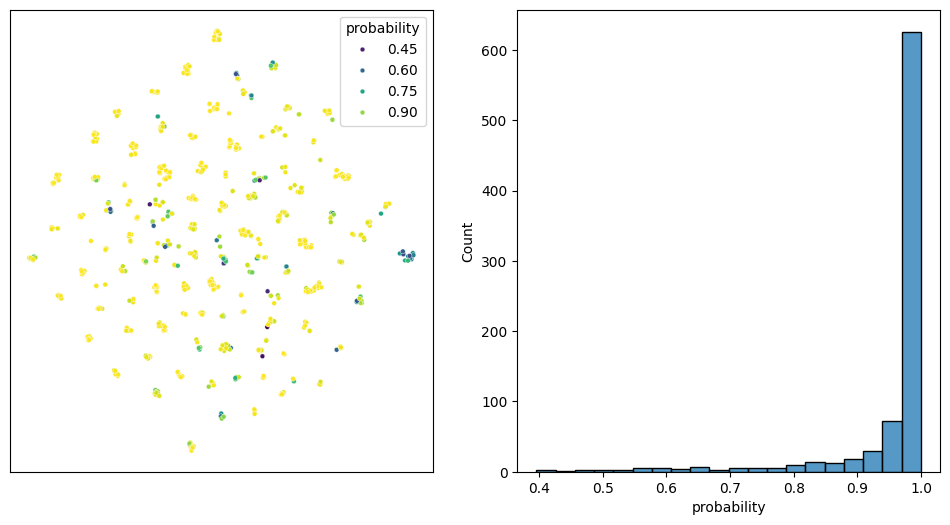

In [9]:
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')

plot_df = train_df.iloc[X_test.index][['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=X_test), axis=1)

fig, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis', s=12)
ax[0].set(xlabel=None) 
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)
fig.show()